In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install polars==1.17.1
#!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 25.8 MB/s eta 0:00:00
  Attempting uninstall: polars
    Found existing installation: polars 1.9.0
    Uninstalling polars-1.9.0:
      Successfully uninstalled polars-1.9.0


In [3]:
import sys

import numpy as np
import pandas as pd
from scipy import stats

from sklearn.metrics import r2_score

#import pyarrow.parquet as pq
import polars as pl

from itertools import combinations

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# import lightgbm as lgb
# from catboost import CatBoostRegressor, EShapCalcType, EFeaturesSelectionAlgorithm

from pathlib import Path
from glob import glob

import matplotlib.pyplot as plt
import seaborn as sns
import gc

DATA_DIR = Path("/content/drive/MyDrive/Colab Notebooks/Jane_Street/data/train.parquet/")

In [4]:
def reduce_memory_usage() -> pl.Expr:
    expressions = [
        pl.col(pl.Float64).cast(pl.Float32),
        pl.col("date_id", "time_id", "feature_11").cast(pl.Int16),
        pl.col("symbol_id", "feature_09", "feature_10").cast(pl.Int8)
        ]
    return expressions

def get_period() -> pl.Expr:
    expressions = [
         pl.when(pl.col('time_id')<332)
        .then(0)
        .when((pl.col('time_id')>=332) & (pl.col('time_id')<725))
        .then(1)
        .otherwise(2)
        .alias('period')
    ]
    return expressions

def get_lag_responders() -> pl.Expr:
    cols = [f"responder_{i}" for i in range(9)]
    expressions = [
        pl.col(col)
        .shift(i)
        .over('symbol_id', 'time_id')
        .alias(f"{col}_lag_{i}")
        for col in cols for i in [1, 2] # lags
        ]
    return expressions


def generate_features(df):
    exprs_1 = [
        reduce_memory_usage(),
        #get_lag_responders(),
        #get_period(),
    ]
    expressions = [e for sublist in exprs_1 for e in sublist]

    df = df.with_row_index()
    df = df.with_columns(expressions)

    return df



def make_correlation_heat_map(df):
    plt.figure(figsize=(15, 10))
    mask = np.triu(np.ones_like(df, dtype=bool))
    sns.heatmap(df.abs(), annot=True, cmap='coolwarm', mask=mask)
    plt.show()

In [16]:
%%time
# train = pl.scan_parquet(DATA_DIR/"partition_id=*/*.parquet")
train = pl.scan_parquet(DATA_DIR)

train = train.filter(pl.col('partition_id')>8)
train = generate_features(train)

CPU times: user 636 µs, sys: 0 ns, total: 636 µs
Wall time: 680 µs


In [17]:
df = train.filter(
    pl.col('symbol_id') == 0,
    pl.col('date_id') == 1630
).collect()

In [18]:
df_nulls = df.null_count()

In [19]:
sel_cols = df_nulls.select(
    pl.col(col) for col in df_nulls.columns if df_nulls[col].item() != 0
).columns

In [20]:
sel_cols

['feature_15',
 'feature_17',
 'feature_32',
 'feature_33',
 'feature_39',
 'feature_41',
 'feature_42',
 'feature_44',
 'feature_50',
 'feature_52',
 'feature_53',
 'feature_55',
 'feature_58',
 'feature_73',
 'feature_74']

In [21]:
df_feat = pl.read_csv("/content/drive/MyDrive/Colab Notebooks/Jane_Street/data/features.csv")
df_feat

feature,tag_0,tag_1,tag_2,tag_3,tag_4,tag_5,tag_6,tag_7,tag_8,tag_9,tag_10,tag_11,tag_12,tag_13,tag_14,tag_15,tag_16
str,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool
"""feature_00""",false,false,true,false,false,false,false,false,false,false,false,false,false,false,true,false,true
"""feature_01""",false,false,true,false,false,false,false,false,false,false,false,false,false,true,true,false,true
"""feature_02""",false,false,true,false,false,false,false,false,false,false,false,false,true,false,false,false,true
"""feature_03""",false,false,true,false,false,false,false,false,false,false,false,false,false,true,false,false,true
"""feature_04""",false,false,true,false,false,false,false,false,false,false,false,false,true,true,false,false,true
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""feature_74""",false,false,false,false,false,false,false,false,true,false,false,false,false,false,true,false,false
"""feature_75""",false,false,false,false,false,false,false,false,true,false,false,false,true,false,false,false,false
"""feature_76""",false,false,false,false,false,false,false,false,true,false,false,false,true,false,false,false,false


In [22]:
symbol_id = np.random.randint(30)
symbol_id

29

In [23]:
def plot_features(feats):
    df =  train.filter(pl.col('symbol_id')==symbol_id).select(['date_id'] + feats).group_by('date_id').mean().collect()
    df = df.drop('date_id').to_pandas()
    plt.figure(figsize=(15, 5))
    plt.title(tag)
    sns.lineplot(df)

# Tag 0

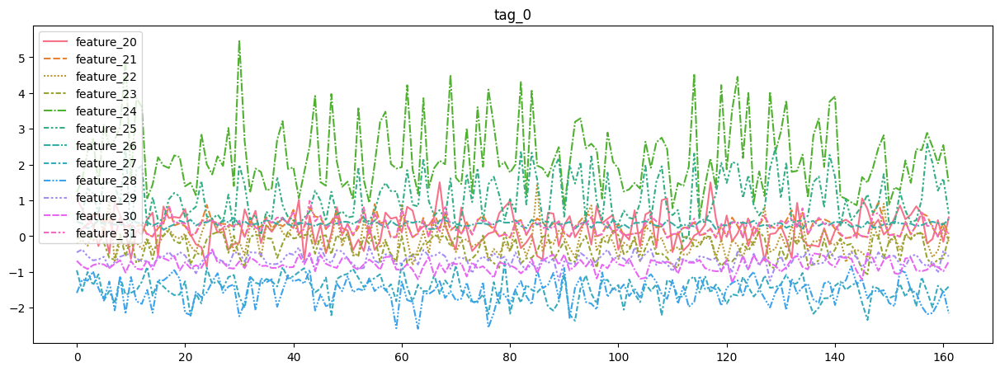

In [24]:
tag = "tag_0"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

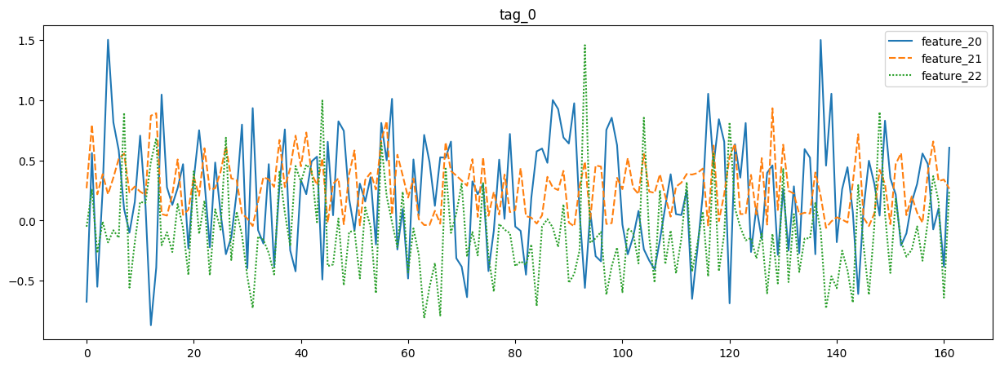

In [25]:
plot_features(sel_cols[:3])

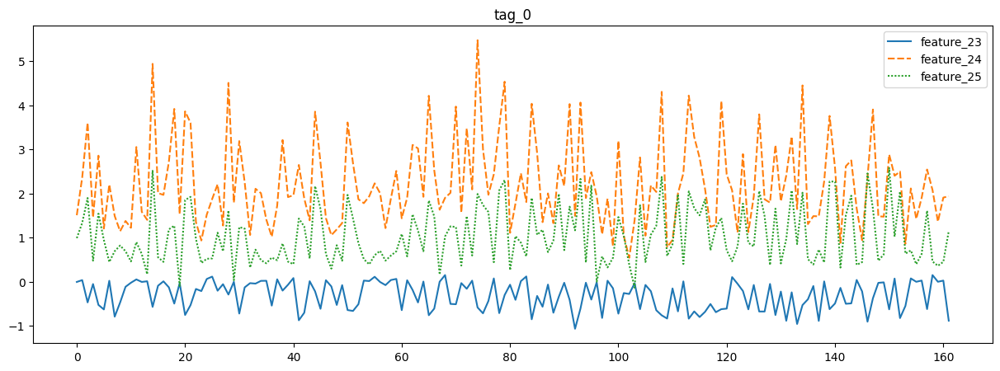

In [26]:
plot_features(sel_cols[3:6])

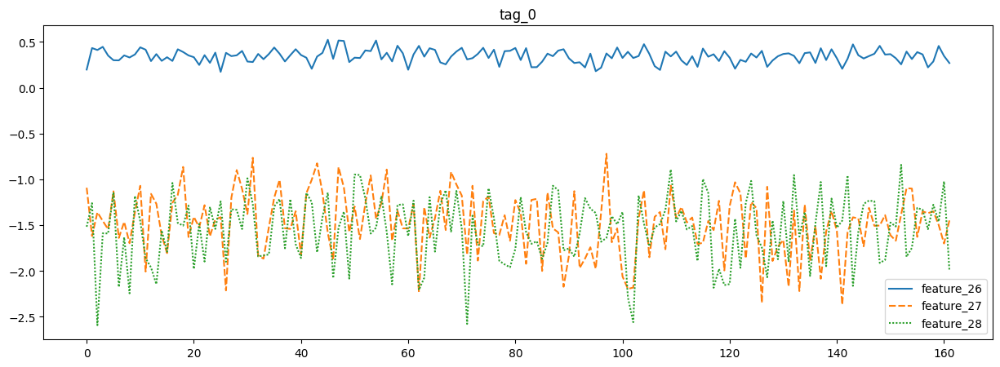

In [27]:
plot_features(sel_cols[6:9])

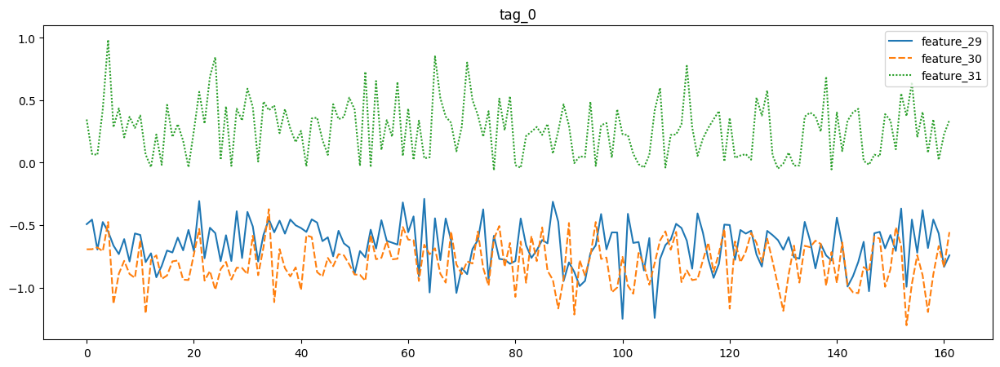

In [28]:
plot_features(sel_cols[9:12])

# Tag 1

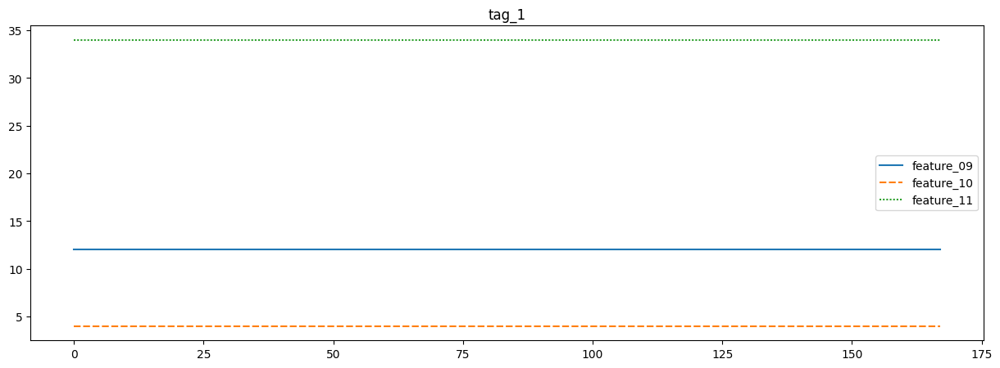

In [29]:
symbol_id = 6

tag = "tag_1"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

In [30]:
for i in range(39):
    print(i, train.filter(pl.col('symbol_id')==i).select('feature_09').unique().collect().to_numpy().reshape(-1))

0 [11]
1 [11]
2 [81]
3 [4]
4 [15]
5 [2]
6 [12]
7 [11]
8 [15]
9 [11]
10 [42]
11 [46]
12 [70]
13 [50]
14 [44]
15 [9]
16 [11]
17 [64]
18 [15]
19 [4]
20 [30]
21 [34]
22 [30]
23 [34]
24 [14]
25 [57]
26 [26]
27 [82]
28 [9]
29 [57]
30 [81]
31 [44]
32 [26]
33 [11]
34 [42]
35 [25 11]
36 [49 68]
37 [34]
38 [50]


In [31]:
for i in range(39):
    print(i, train.filter(pl.col('symbol_id')==i).select('feature_10').unique().collect().to_numpy().reshape(-1))

0 [7]
1 [7]
2 [2]
3 [3]
4 [1]
5 [10]
6 [4]
7 [7]
8 [1]
9 [7]
10 [5]
11 [3]
12 [7]
13 [1]
14 [3]
15 [3]
16 [7]
17 [6]
18 [1]
19 [3]
20 [10]
21 [4]
22 [10]
23 [4]
24 [10]
25 [1]
26 [12]
27 [3]
28 [3]
29 [1]
30 [2]
31 [3]
32 [12]
33 [7]
34 [5]
35 [7]
36 [7 6]
37 [4]
38 [1]


In [32]:
for i in range(39):
    print(i, train.filter(pl.col('symbol_id')==i).select('feature_11').unique().collect().to_numpy().reshape(-1))

0 [76]
1 [76]
2 [59]
3 [11]
4 [9]
5 [171]
6 [34]
7 [76]
8 [62]
9 [76]
10 [150]
11 [261]
12 [410]
13 [522]
14 [16]
15 [25]
16 [76]
17 [376]
18 [66]
19 [11]
20 [50]
21 [214]
22 [13]
23 [214]
24 [40]
25 [230]
26 [158]
27 [539]
28 [25]
29 [336]
30 [534]
31 [24]
32 [158]
33 [76]
34 [150]
35 [195  76]
36 [388 297]
37 [214]
38 [522]


# Tag 2

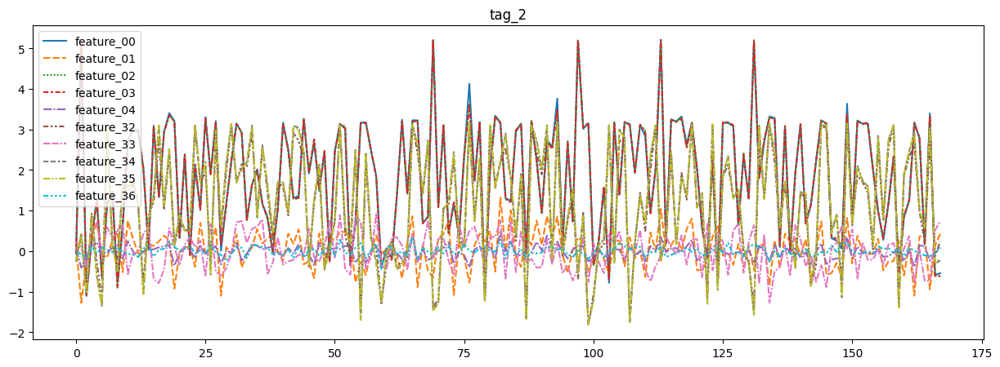

In [33]:
tag = "tag_2"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

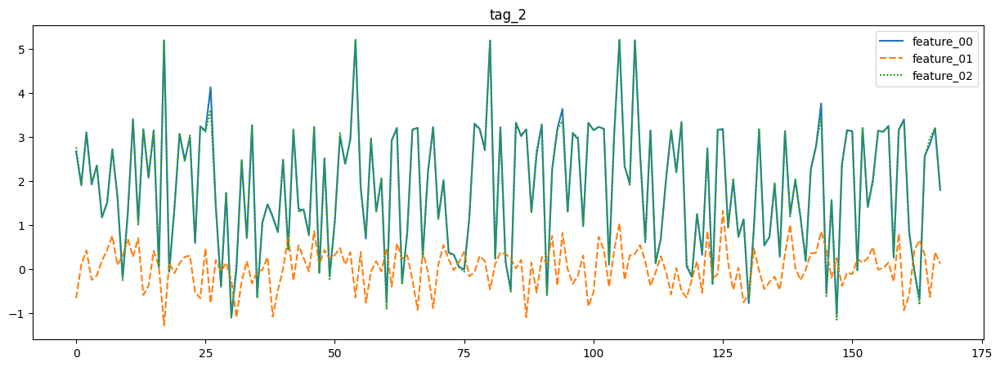

In [34]:
plot_features(sel_cols[:3])

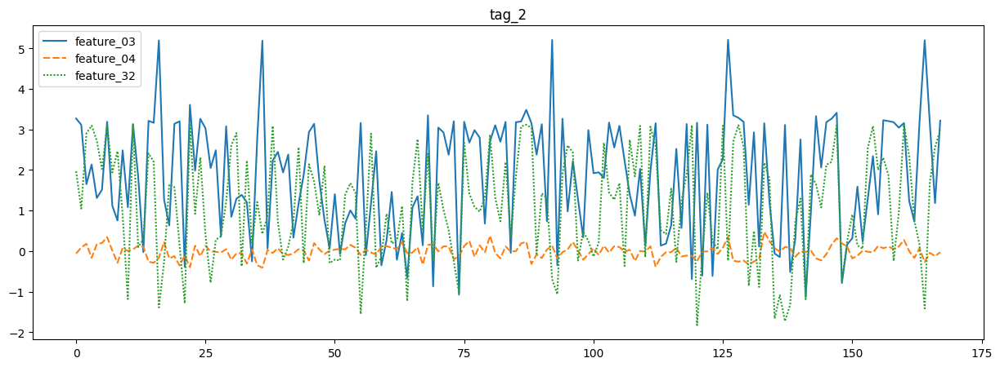

In [35]:
plot_features(sel_cols[3:6])

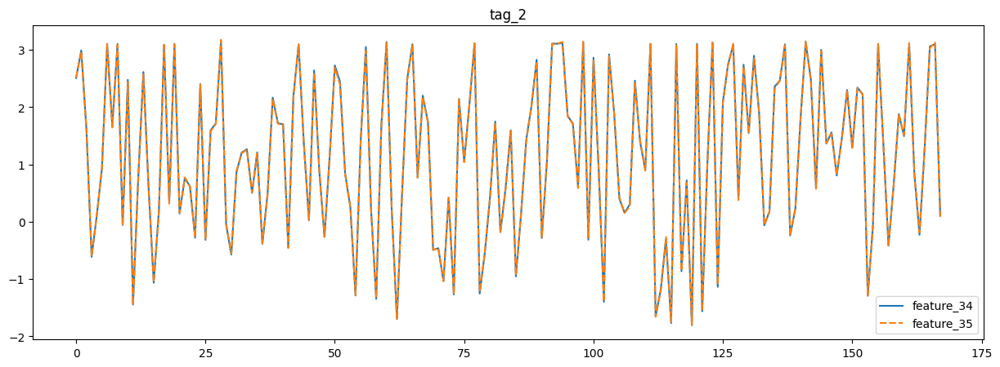

In [36]:
plot_features(sel_cols[7:9])

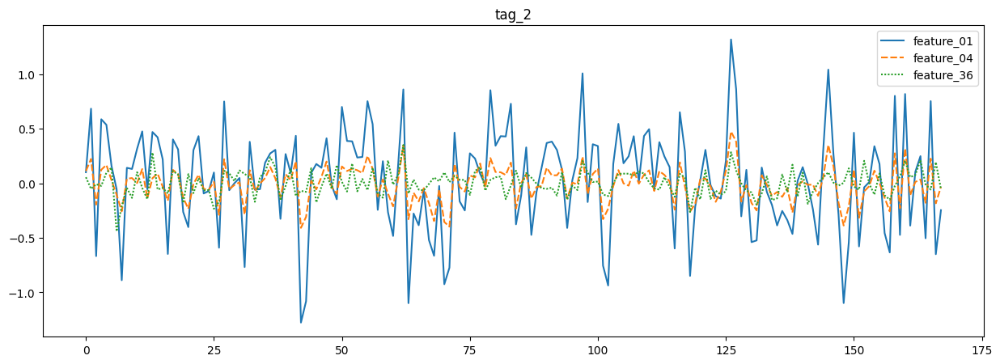

In [37]:
plot_features(['feature_01', 'feature_04', 'feature_36'])

# Tag 3

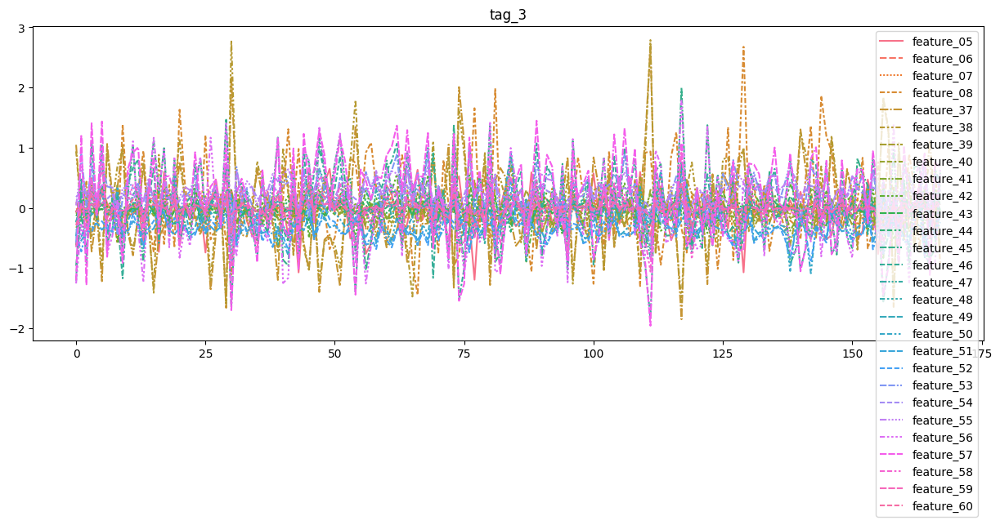

In [38]:
tag = "tag_3"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

In [39]:
len(sel_cols)

28

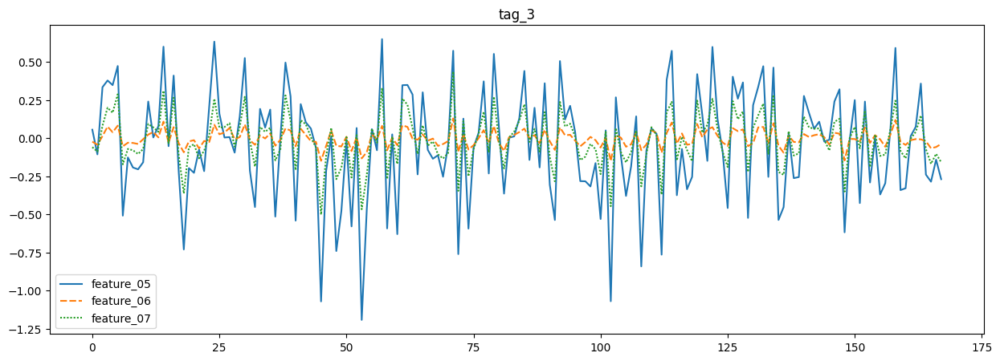

In [40]:
plot_features(sel_cols[:3])

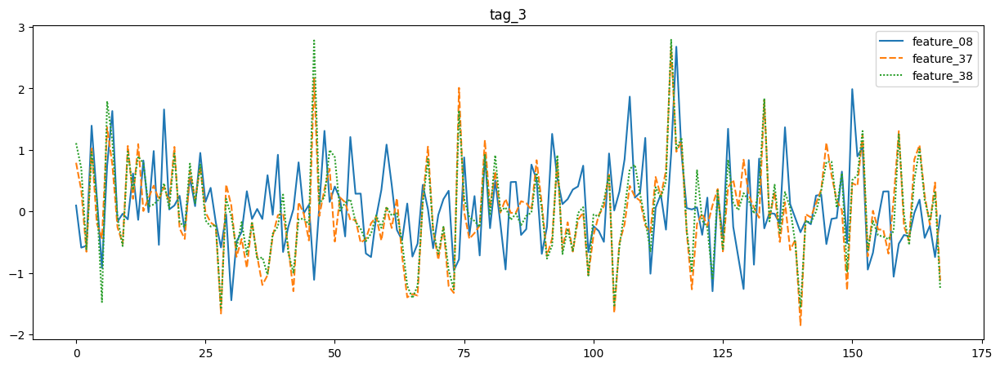

In [41]:
plot_features(sel_cols[3:6])

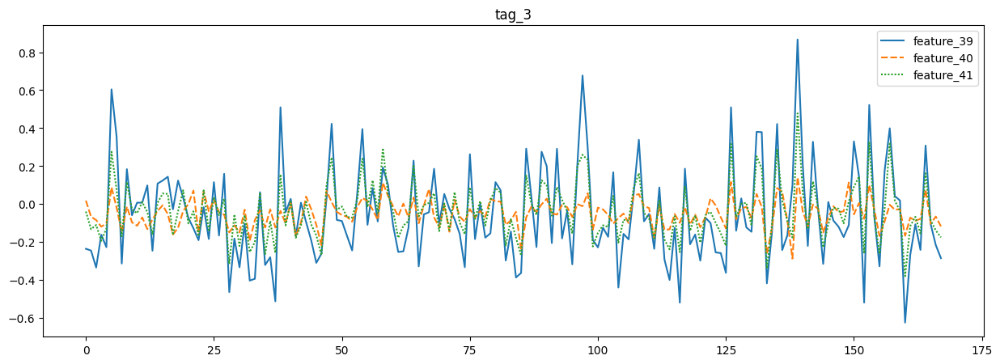

In [42]:
plot_features(sel_cols[6:9])

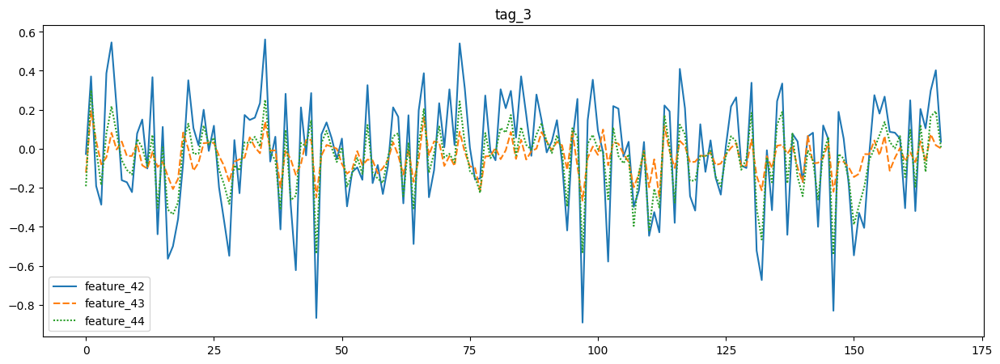

In [43]:
plot_features(sel_cols[9:12])

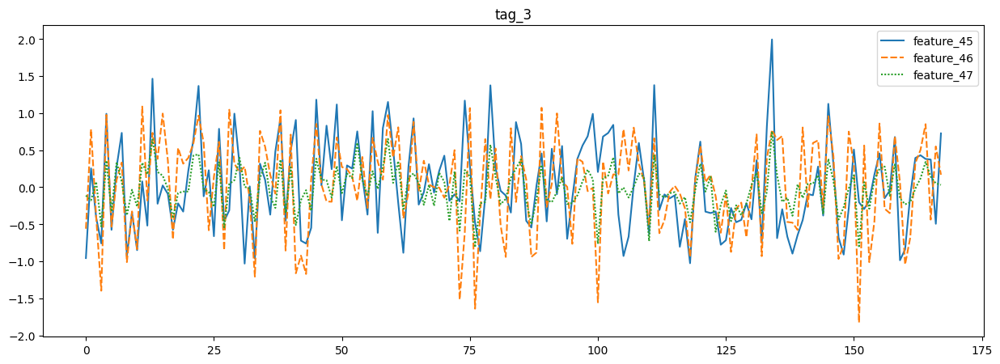

In [44]:
plot_features(sel_cols[12: 15])

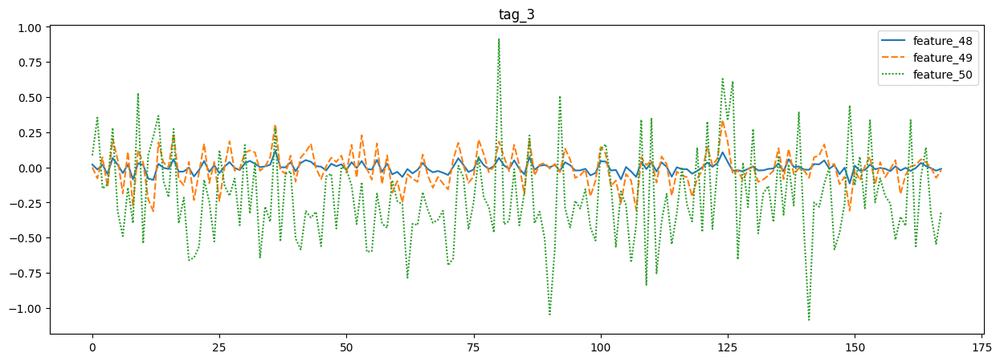

In [45]:
plot_features(sel_cols[15: 18])

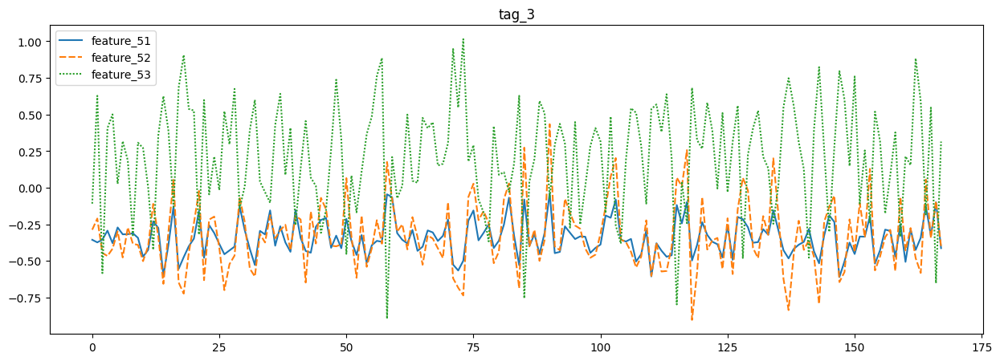

In [46]:
plot_features(sel_cols[18:21])

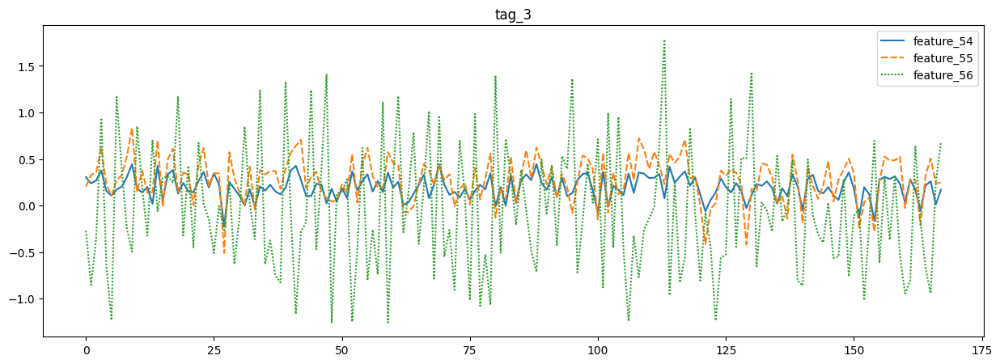

In [47]:
plot_features(sel_cols[21:24])

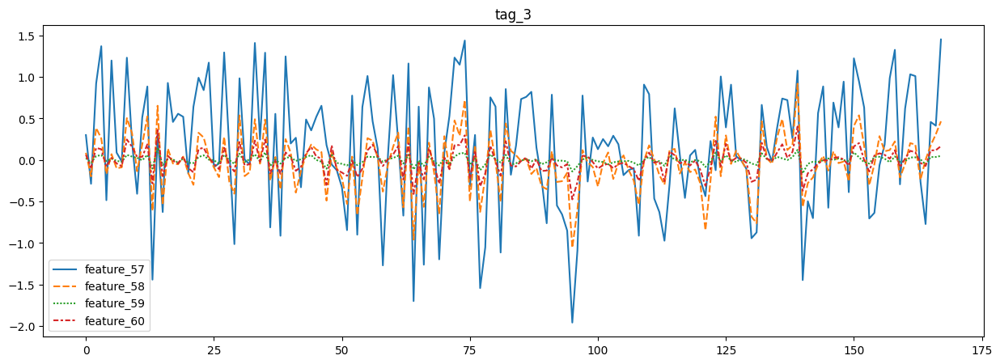

In [48]:
plot_features(sel_cols[24:28])

# Tag 4

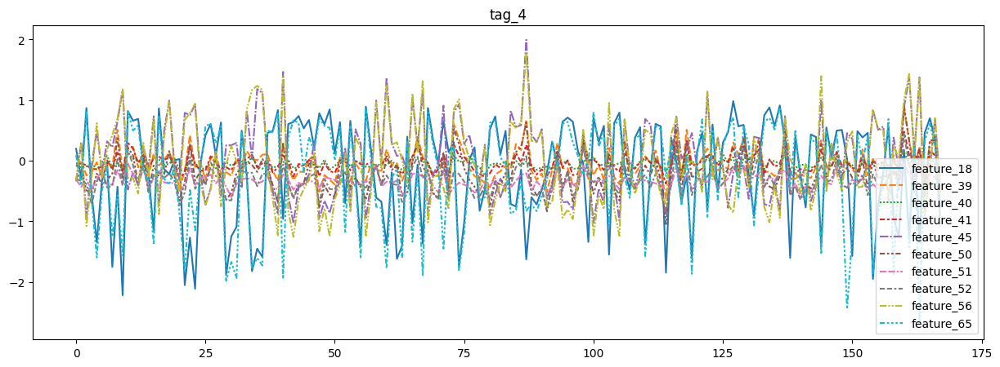

In [49]:
tag = "tag_4"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

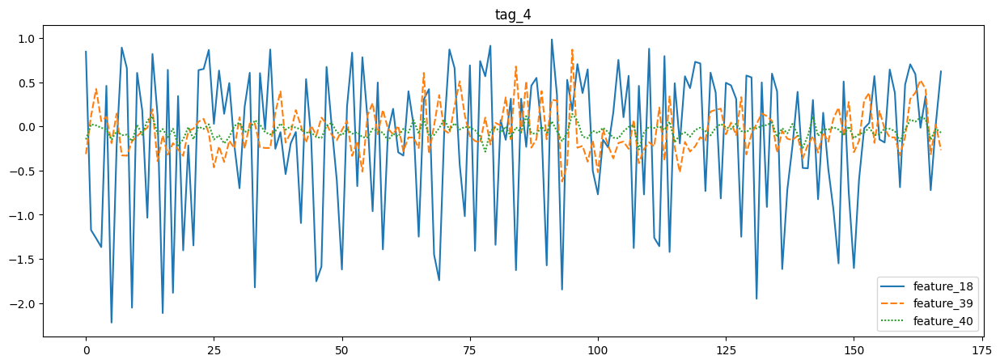

In [50]:
plot_features(sel_cols[:3])

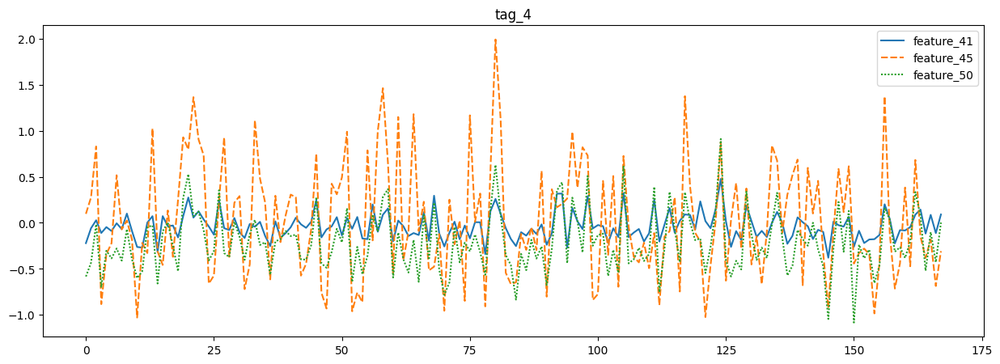

In [51]:
plot_features(sel_cols[3:6])

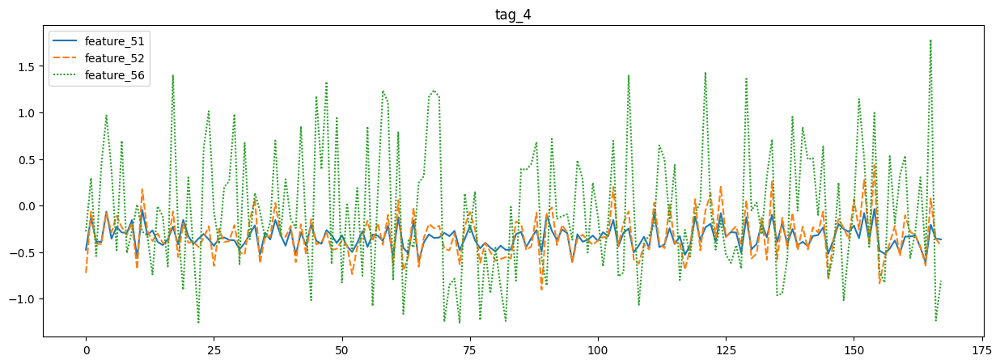

In [52]:
plot_features(sel_cols[6:9])

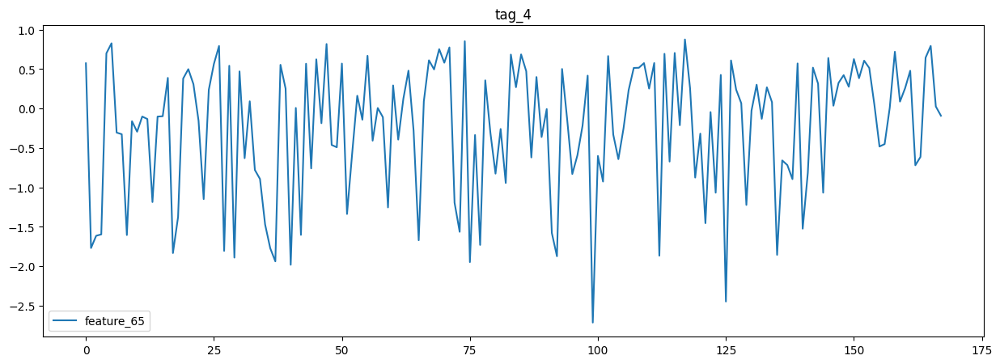

In [53]:
plot_features(sel_cols[9:12])

# Tag 5

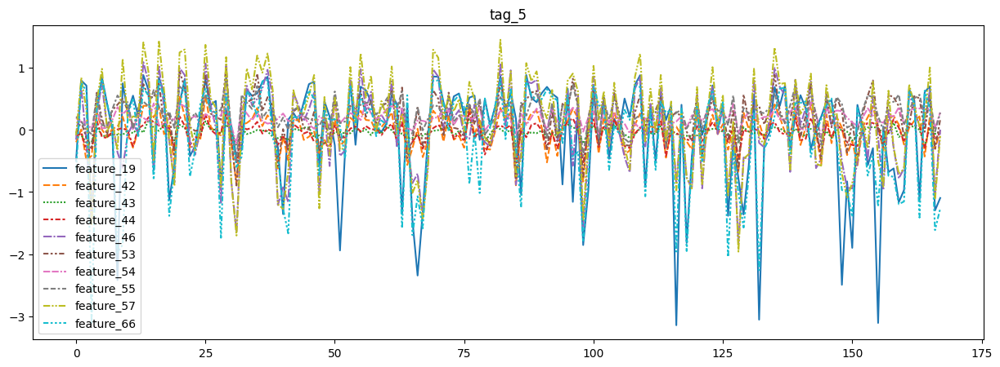

In [54]:
tag = "tag_5"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

# Tag 6

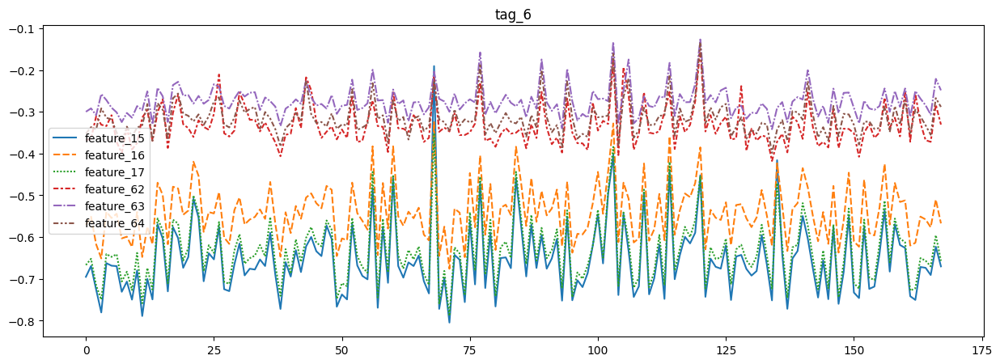

In [55]:
tag = "tag_6"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

# Tag 7

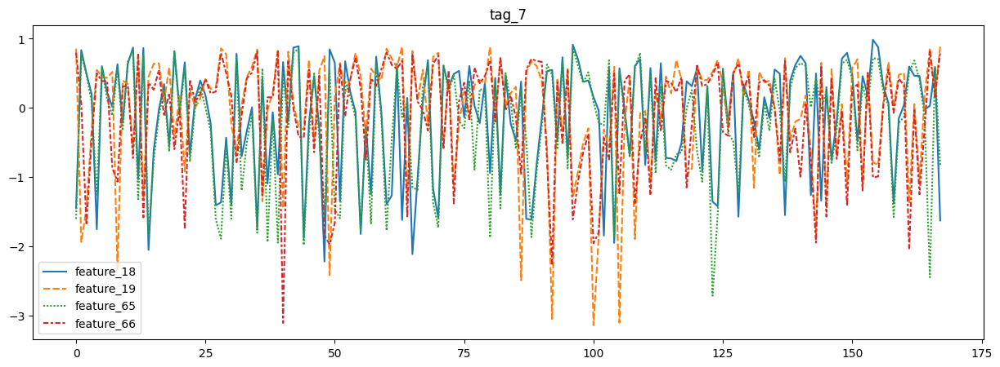

In [56]:
tag = "tag_7"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

# Tag 8

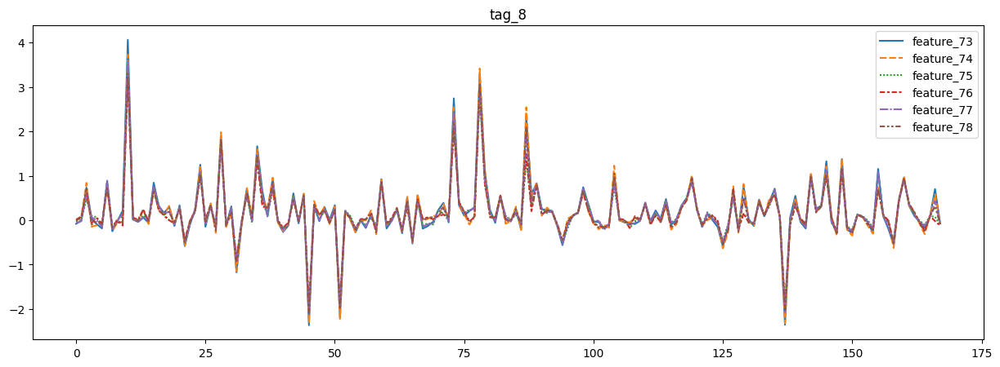

In [57]:
tag = "tag_8"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

# Tag 9

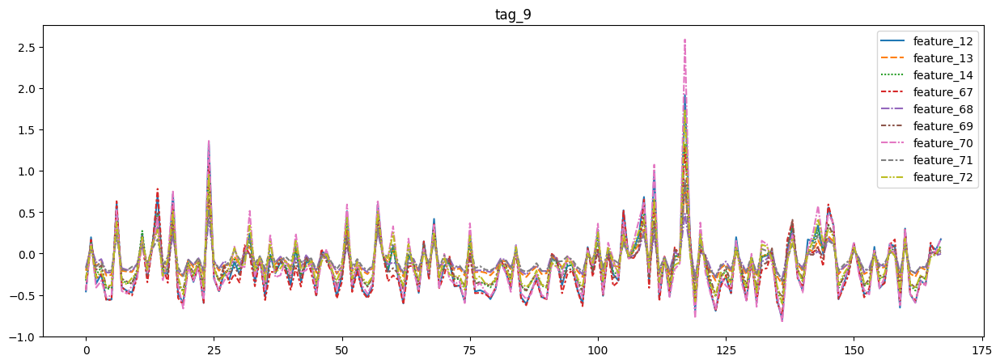

In [58]:
tag = "tag_9"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

# Tag 10

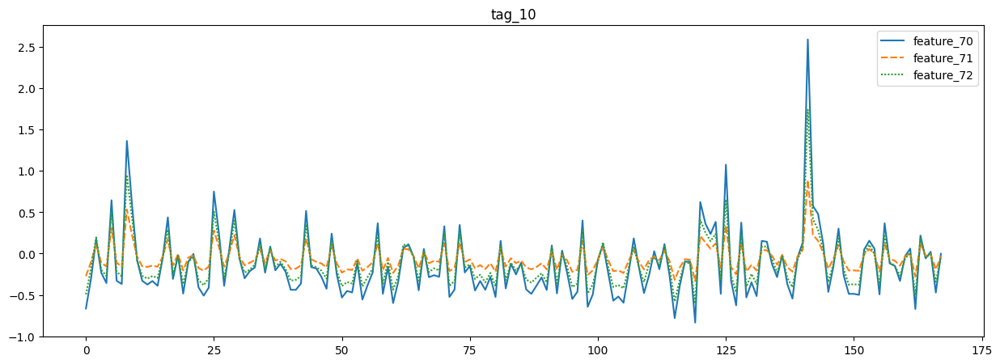

In [59]:
tag = "tag_10"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

# Tag 11

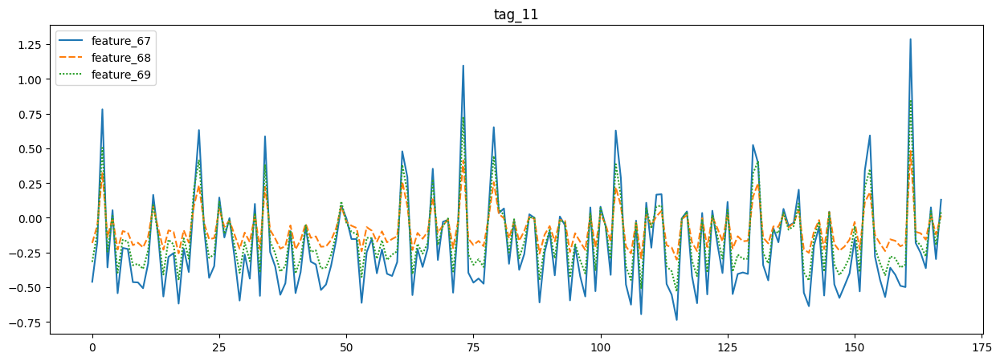

In [60]:
tag = "tag_11"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

# Tag 12

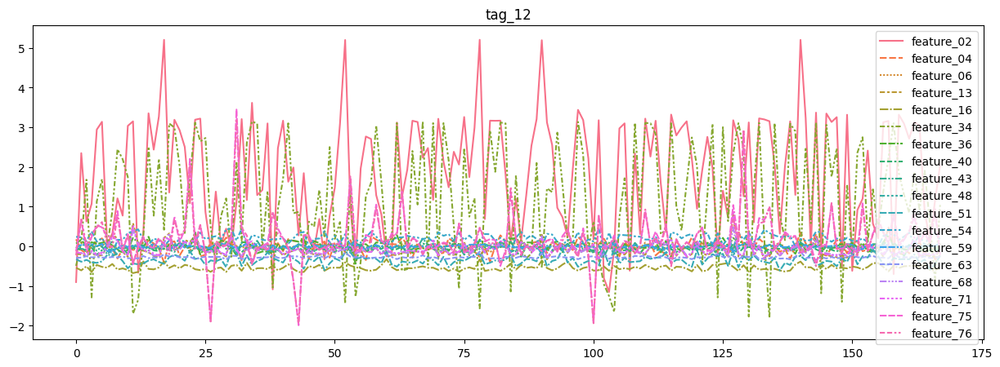

In [61]:
tag = "tag_12"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

# Tag 13

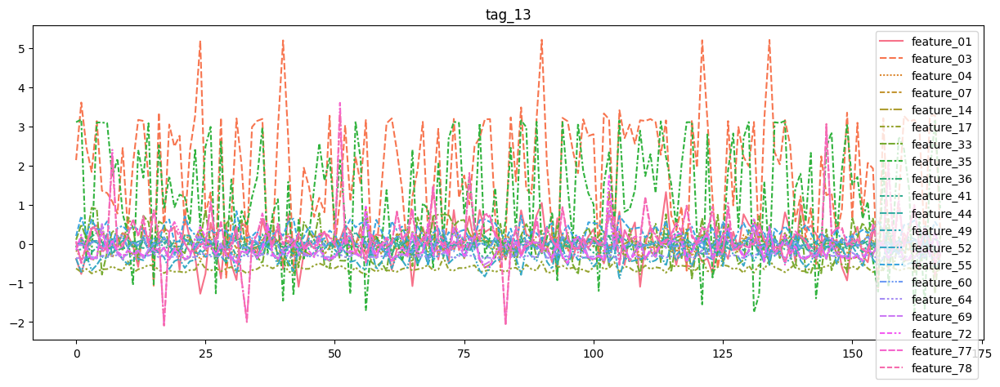

In [62]:
tag = "tag_13"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

# Tag 14

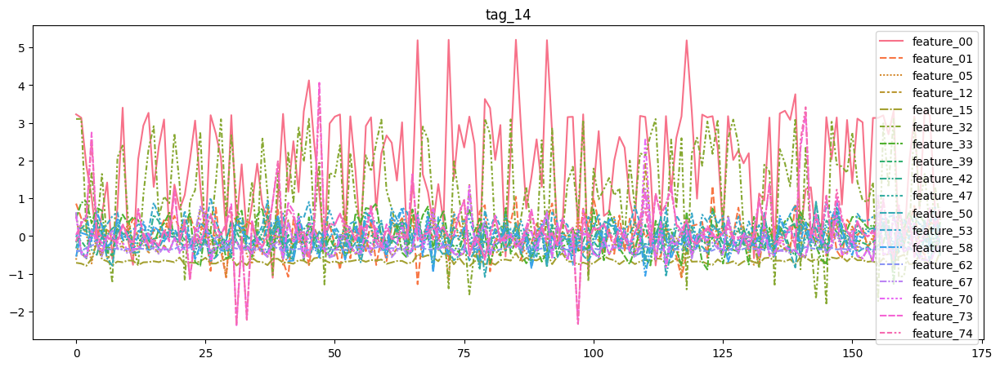

In [63]:
tag = "tag_14"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

# Tag 15

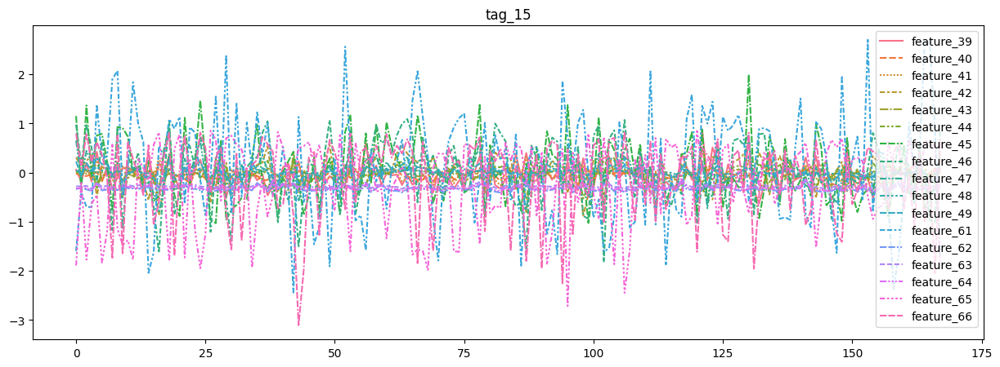

In [64]:
tag = "tag_15"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

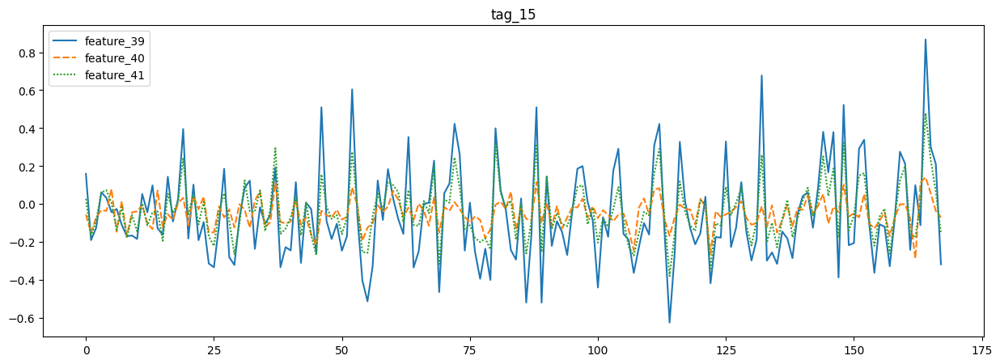

In [65]:
plot_features(sel_cols[:3])

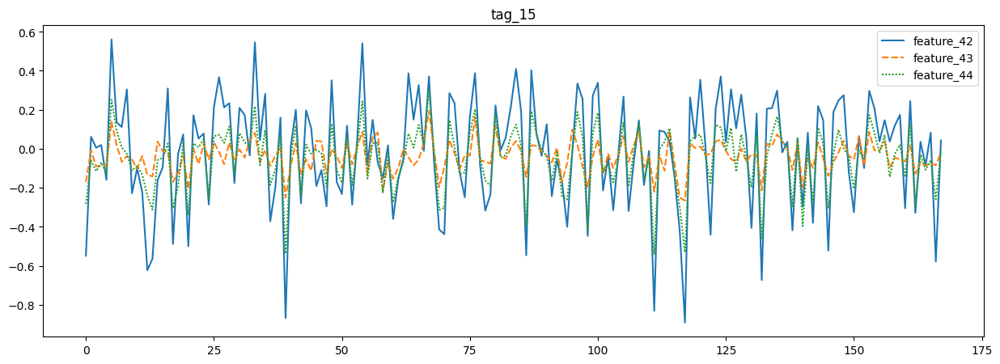

In [66]:
plot_features(sel_cols[3:6])

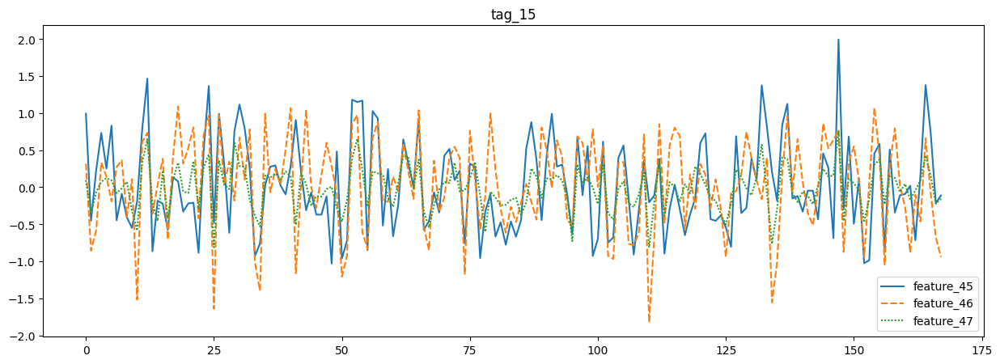

In [67]:
plot_features(sel_cols[6:9])

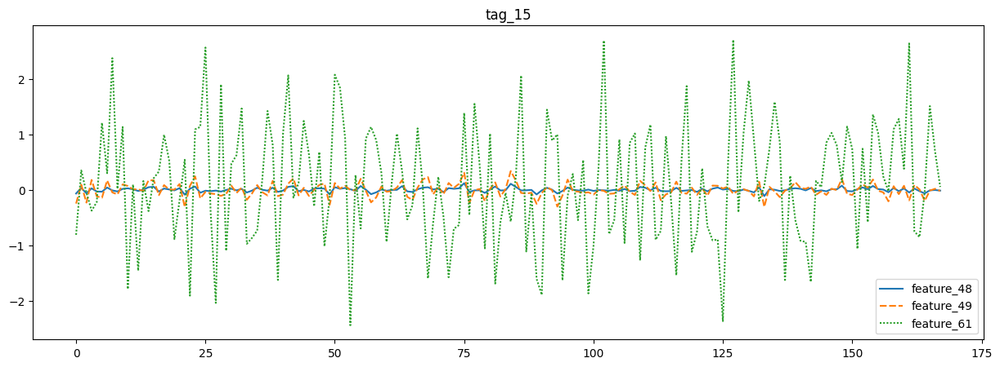

In [68]:
plot_features(sel_cols[9:12])

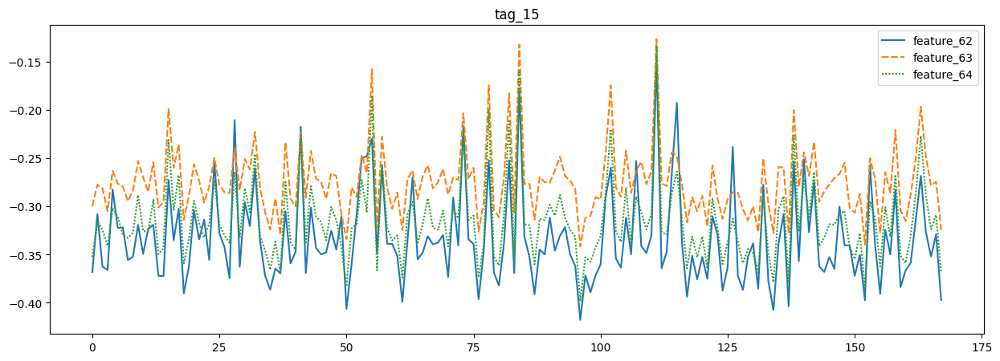

In [69]:
plot_features(sel_cols[12:15])

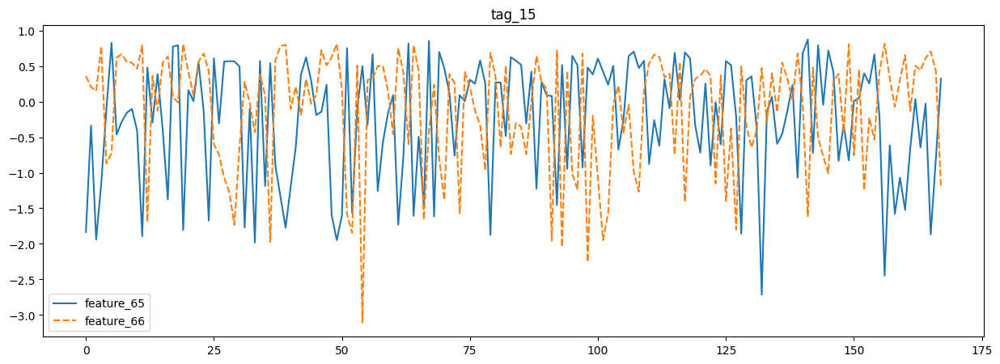

In [70]:
plot_features(sel_cols[15:18])

# Tag 16

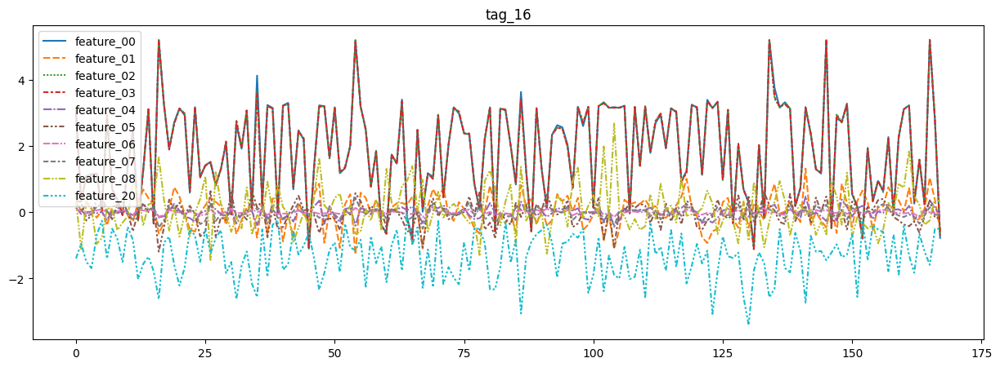

In [71]:
tag = "tag_16"
sel_cols = df_feat.filter(pl.col(tag)==True)['feature'].to_list()

plot_features(sel_cols)

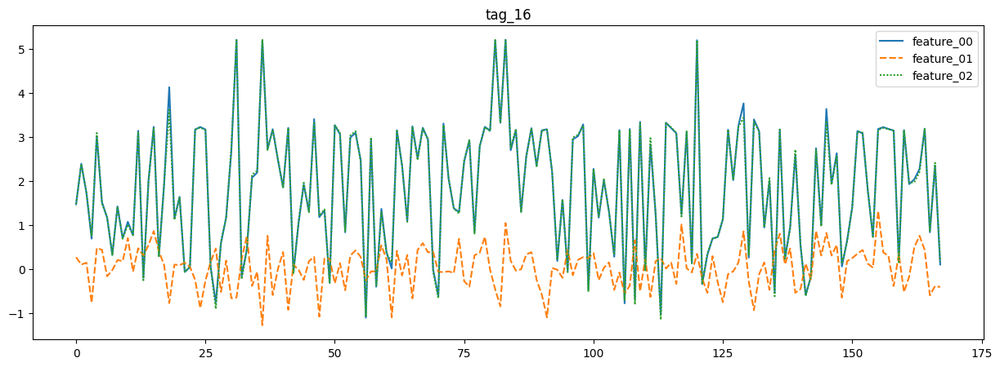

In [72]:
plot_features(sel_cols[:3])

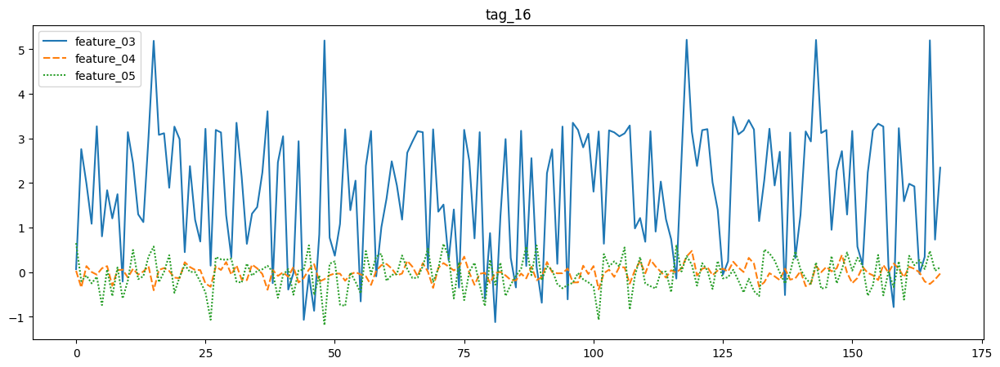

In [73]:
plot_features(sel_cols[3: 6])

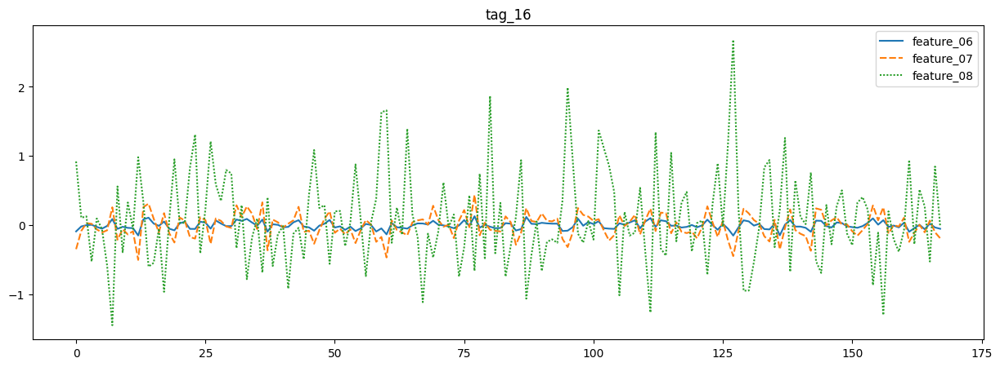

In [74]:
plot_features(sel_cols[6:9])

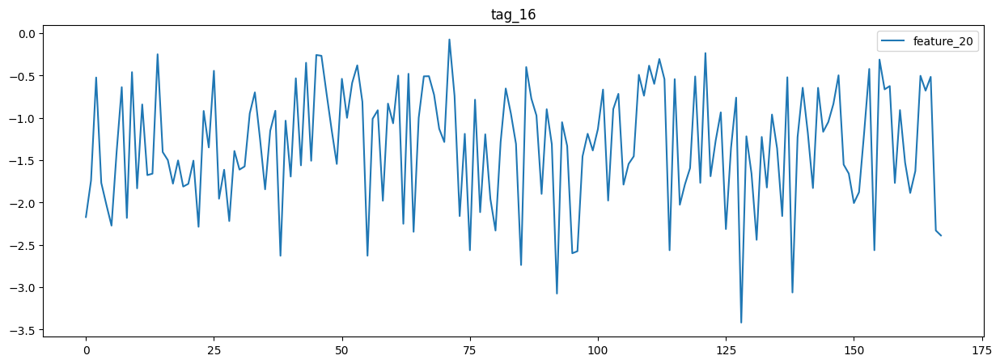

In [75]:
plot_features(sel_cols[9:12])

In [76]:
feature_tags = []
for i in range(17):
    feature_tags.append(
        df_feat.filter(pl.col(f"tag_{i}")==True)['feature'].to_list()
    )

In [77]:
feature_tags[1]

['feature_09', 'feature_10', 'feature_11']

In [78]:
for i in range(17):
    tag = 16
    a = set(feature_tags[tag])
    if i != tag:
       b = set(feature_tags[i])
       print(a.intersection(b))

{'feature_20'}
set()
{'feature_00', 'feature_04', 'feature_03', 'feature_02', 'feature_01'}
{'feature_07', 'feature_06', 'feature_05', 'feature_08'}
set()
set()
set()
set()
set()
set()
set()
set()
{'feature_06', 'feature_02', 'feature_04'}
{'feature_03', 'feature_04', 'feature_01', 'feature_07'}
{'feature_05', 'feature_00', 'feature_01'}
set()
